In [1]:
# Import useful libraries
import matplotlib.pyplot as plt
import seaborn as sns
import statistics as sts
from scipy import stats
import re
import pandas as pd
import numpy as np
from numpy import zeros
from numpy import asarray
from numpy import array
import itertools
import collections
import csv

# Tunning plots
import matplotlib.lines as mlines
from matplotlib.ticker import MaxNLocator
from wordcloud import WordCloud, ImageColorGenerator
%matplotlib inline
pd.set_option('display.max_columns', 100)
pd.set_option("display.max_rows",100)
SEED = 15432

# scikit-learn
from sklearn.linear_model            import LinearRegression, LogisticRegression, Ridge, RidgeCV, Lasso
from sklearn.svm                     import SVC
from sklearn.ensemble                import RandomForestClassifier
from sklearn.ensemble                import GradientBoostingClassifier
from sklearn.preprocessing           import LabelEncoder,OneHotEncoder
from sklearn.model_selection         import StratifiedKFold
from sklearn.model_selection         import validation_curve
from sklearn.model_selection         import train_test_split
from sklearn.metrics                 import confusion_matrix
from sklearn.metrics                 import accuracy_score
from sklearn.model_selection         import train_test_split
from sklearn.model_selection         import cross_val_predict
from sklearn.model_selection         import cross_val_score
from sklearn                         import metrics
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition           import TruncatedSVD
from sklearn.naive_bayes             import GaussianNB
from sklearn.metrics         import roc_curve, roc_auc_score

# Ignore some warnings 
import warnings
warnings.filterwarnings('ignore')

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils  import simple_preprocess
from gensim.models import CoherenceModel

# NLTK
import nltk
from nltk.tokenize import word_tokenize
from nltk.tokenize import WordPunctTokenizer
from nltk.stem     import WordNetLemmatizer 
from nltk.corpus   import stopwords

# Read/Write xlsx files
from openpyxl import workbook 
from openpyxl import load_workbook
import os

In [2]:
# Data Wrangling
import numpy as np
import pandas as pd
from functools import reduce

# Web scraping
import requests
from bs4 import BeautifulSoup
from multiprocessing import Pool

# Data cleaning
import re
import unicodedata

# Data visualization
import cufflinks as cf
from IPython.display import Image
from stylecloud import gen_stylecloud
from tensorflow.keras.utils import plot_model
from PIL import Image
import cufflinks as cf
from stylecloud import gen_stylecloud

# Data modeling
from keras import Model
from keras.layers import GRU
from keras.layers import Input
from keras.layers import Dense
from sklearn.cluster import KMeans
from keras.layers import Embedding
from keras.layers import Activation
from keras.layers import concatenate
from tensorflow.keras.optimizers import Adam
from keras.layers import LSTM
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import SpatialDropout1D
from keras.callbacks import EarlyStopping, ModelCheckpoint

from keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
from keras import metrics

# Data preprocessing
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
import unicodedata
from langdetect import detect
from bs4 import BeautifulSoup
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize 
from nltk.corpus import stopwords
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.sequence import pad_sequences


# Text mining
from nltk.corpus import stopwords
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from nltk.tokenize import sent_tokenize, word_tokenize 
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Model performance
from keras import metrics
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

cf.go_offline()

import nltk
#nltk.download('vader_lexicon')

# Environment setup
cf.go_offline()

In [3]:
df=pd.read_csv("sentimientos_nn.csv")

In [4]:
df

,Unnamed: 0,id_id,d_at,t_content,v_reviewCreatedVersion,t_reviewId,c_thumbsUpCount,tgt,idioma,t_content_clean,list_of_words,longitud
0,139554,139556,2021-06-14 06:51:28,ok,11 33 210429,gp aoqptohhu8sirtewfm22hrszz3vh5v0wqsdmik9ba8j...,0,1,__label__en,NaN,[],0
1,181789,181791,2020-10-27 22:05:24,esta fallando y no puedo ingresar ya elimine e...,11 24 200905,gp aoqptohgojgppexssrb14n 512ml1vabyj1qlqxqhlp...,0,1,__label__es,fallando puedo ingresar elimine cache puedo in...,"['fallando', 'puedo', 'ingresar', 'elimine', '...",7
2,182628,182630,2020-12-02 10:20:51,like,11 27 201107,gp aoqptohlam2kb6doypd30pl8wg3es5xrxy7zwsvm9a1...,0,1,__label__en,like,['like'],1
3,35782,35783,2020-03-28 07:53:04,buena,11 17 200207,gp aoqptogvcuwmstqn5kclkrwkyi1dskpfztuqw9wwv q...,0,1,__label__es,buena,['buena'],1
4,196550,196552,2020-10-06 15:42:03,excelente aplicacion,11 25 200922,gp aoqptoeaoz96bupqnq7h30dxgob8 cudb7 xkuwvmnf...,0,1,__label__es,excelente,['excelente'],1
...,...,...,...,...,...,...,...,...,...,...,...,...
159993,12674,12674,2019-12-10 19:10:28,no puedo entrar a los apartados tengo que cerr...,10 90,gp aoqptoenkacpjvs4id0w06cawgmucecjvw1wct6r0zt...,0,0,__label__es,puedo entrar apartados cerrar sesion veces dej...,"['puedo', 'entrar', 'apartados', 'cerrar', 'se...",8
159994,118761,118763,2020-12-30 15:44:39,no deja hacer el pago del prestamo de nomina,11 28 201209,gp aoqptoh6xferd8wqhshl9yactb6hof3j6qqwgkbmekn...,0,0,__label__es,deja hacer pago prestamo nomina,"['deja', 'hacer', 'pago', 'prestamo', 'nomina']",5
159995,34056,34057,2020-02-16 10:04:15,muy pocas veces ls utilizo,10 90,gp aoqptohu7fchzatf1gu4zjoy k1obv3ew7wxh4wfh6v...,0,1,__label__es,pocas veces utilizo,"['pocas', 'veces', 'utilizo']",3
159996,151617,151619,2021-05-15 11:52:24,excelente app super facil de usar muy practico...,11 33 210429,gp aoqptofhws1lczezljawayen36xzstnxcbo9jrl4xtx...,0,1,__label__es,excelente super facil usar practico recomiendo...,"['excelente', 'super', 'facil', 'usar', 'pract...",7


In [5]:
df.columns

Index(['Unnamed: 0', 'id_id', 'd_at', 't_content', 'v_reviewCreatedVersion',
       't_reviewId', 'c_thumbsUpCount', 'tgt', 'idioma', 't_content_clean',
       'list_of_words', 'longitud'],
      dtype='object')

In [6]:
df=df.drop(columns="Unnamed: 0")

In [7]:
def text_clean(text, pattern="[^a-zA-Z0-9 ]"):
    text_clean = unicodedata.normalize('NFD', text).encode('ascii', 'ignore')
    text_clean= re.sub(pattern, " ", text_clean.decode("utf-8"), flags=re.UNICODE)
    text_clean = u' '.join(text_clean.lower().split())
    return text_clean

In [8]:
from nltk import FreqDist

In [9]:
#Traemos algunas funciones que nos pueden servir
import sys
sys.path.append("Funciones_tarea2/")
from library import *

In [10]:
completitud(df)

,columna,total,completitud
0,t_content_clean,2137,98.664358
1,t_content,1010,99.368742
2,id_id,0,100.000000
3,d_at,0,100.000000
4,v_reviewCreatedVersion,0,100.000000
5,t_reviewId,0,100.000000
6,c_thumbsUpCount,0,100.000000
7,tgt,0,100.000000
8,idioma,0,100.000000
9,list_of_words,0,100.000000


In [11]:
df["t_content"]=df["t_content"].replace(np.nan, 0)

In [12]:
aux=df[df["t_content"]==0]# pueden ser valores que se pierden al poner la restricción de no tener palabras de menos de 3 letras

In [13]:
aux

,id_id,d_at,t_content,v_reviewCreatedVersion,t_reviewId,c_thumbsUpCount,tgt,idioma,t_content_clean,list_of_words,longitud
526,173504,2020-04-30 21:51:27,0,11 14 191203,gp aoqptog744ffupel qxq3a6oifbzvmk r4t17nta76z...,0,1,__label__en,NaN,[],0
564,91633,2019-08-30 12:04:49,0,10 90,gp aoqptofstndzu cvy4iy0aca6bvv1ufw fprwuxryrq...,0,1,__label__en,NaN,[],0
655,69622,2019-07-04 15:24:12,0,10 90,gp aoqptog7nw39sobkqxpby vze beixrg034m1puukkb...,0,1,__label__en,NaN,[],0
698,141254,2021-05-11 12:10:29,0,11 33 210429,gp aoqptoh16a ncwib2z kf 2ueav75qfa9vdyaw8oekh...,0,0,__label__en,NaN,[],0
755,19034,2019-11-05 15:36:45,0,11 11 191003,gp aoqptofkvybh vw3e xzva5iy7jrsikio0i2a3f6bsf...,0,1,__label__en,NaN,[],0
...,...,...,...,...,...,...,...,...,...,...,...
159426,62489,2019-08-17 11:39:12,0,10 90,gp aoqptoghebaye2xoli 3gtow3s fuj6clr7hj3rxz e...,0,1,__label__en,NaN,[],0
159830,150105,2021-05-14 08:31:40,0,11 33 210429,gp aoqptoh7qqkvze u88xzomuut1a6tslpojgy1ecfq55...,0,1,__label__en,NaN,[],0
159892,127041,2021-02-06 14:47:22,0,11 29 210108,gp aoqptoew4nrhmwl9buavd7sxsvmhmpudwnwnx15mizh...,0,1,__label__en,NaN,[],0
159894,69240,2019-07-12 22:20:52,0,10 90,gp aoqptoe fmx6bjuvc2rzwtmgh26i5pawy9p4xyh3qxg...,0,1,__label__en,NaN,[],0


In [14]:
df=df[df["t_content"]!=0]

In [15]:
df.shape

(158988, 11)

In [16]:
df["t_content_clean"]=df["t_content_clean"].replace(np.nan, 0)

In [17]:
aux=df[df["t_content_clean"]==0]

In [18]:
aux

,id_id,d_at,t_content,v_reviewCreatedVersion,t_reviewId,c_thumbsUpCount,tgt,idioma,t_content_clean,list_of_words,longitud
0,139556,2021-06-14 06:51:28,ok,11 33 210429,gp aoqptohhu8sirtewfm22hrszz3vh5v0wqsdmik9ba8j...,0,1,__label__en,0,[],0
404,143096,2021-05-08 21:31:45,si,11 33 210429,gp aoqptogvxhflewrpymm3bkn2fuax0bxbdbupzbl ggh...,0,1,__label__it,0,[],0
573,79772,2019-09-26 17:30:40,ok,11 02 20190725,gp aoqptog bvq4mm1nrumhgbwbkuidxumq7rdmmoc9n55...,0,1,__label__en,0,[],0
600,134131,2021-06-19 15:17:37,ok,11 34 210607,gp aoqptoexohp56jqwaesua1xzvo9mscrk8demqn3ipae...,0,1,__label__en,0,[],0
614,194220,2020-10-02 09:08:55,ok,11 25 200922,gp aoqptofgsohfvnckkv0sini76m50pcmkadfwr3vluzn...,0,1,__label__en,0,[],0
...,...,...,...,...,...,...,...,...,...,...,...
159087,167069,2020-04-06 23:37:06,nd,11 19 200323,gp aoqptoeg5reanewcckyoquvaup5q7t0t lxwuqiiznx...,0,1,__label__en,0,[],0
159123,158461,2020-07-17 00:03:51,ok,11 22 200708,gp aoqptoforhqulsr1iana15eh0 2gssgp9ltl1gp v4u...,0,1,__label__en,0,[],0
159607,13912,2019-12-15 20:32:27,esta op,10 90,gp aoqptoekbzlt5yxsdyx 1msggjtfhpaf0luum56rpmp...,0,1,__label__es,0,[],0
159754,134982,2021-06-18 12:27:54,ok,11 34 210607,gp aoqptogtmlqlu2wudtueqg 9eg6paqgolukanzzvdn4...,0,1,__label__en,0,[],0


In [19]:
df=df[df["t_content_clean"]!=0]

In [20]:
df.shape

(157861, 11)

In [21]:
validate=pd.read_csv("validate_nn.csv")

In [22]:
completitud(validate)

,columna,total,completitud
0,t_content_clean,524,98.6900
1,t_content,265,99.3375
2,Unnamed: 0,0,100.0000
3,id_id,0,100.0000
4,d_at,0,100.0000
5,v_reviewCreatedVersion,0,100.0000
6,t_reviewId,0,100.0000
7,c_thumbsUpCount,0,100.0000
8,tgt,0,100.0000
9,idioma,0,100.0000


In [23]:
validate["t_content_clean"]=validate["t_content_clean"].replace(np.nan, 0)

In [24]:
validate=validate[validate["t_content_clean"]!=0]

In [25]:
completitud(validate)

,columna,total,completitud
0,Unnamed: 0,0,100.0
1,id_id,0,100.0
2,d_at,0,100.0
3,t_content,0,100.0
4,v_reviewCreatedVersion,0,100.0
5,t_reviewId,0,100.0
6,c_thumbsUpCount,0,100.0
7,tgt,0,100.0
8,idioma,0,100.0
9,t_content_clean,0,100.0


In [26]:
validate=validate.drop(columns="Unnamed: 0")

In [27]:
#No negativo es cuando tgt=1
data_aux=df[df["tgt"]==1]
data_aux["t_content_clean"]=data_aux["t_content_clean"].astype(str)
corpus_1=" ".join(data_aux["t_content_clean"].values)
texto_clean=text_clean(corpus_1)
fdist1=FreqDist(texto_clean.split())
fdist1

FreqDist({'excelente': 28858, 'buena': 21632, 'bien': 7854, 'facil': 7436, 'servicio': 5194, 'mejor': 4378, 'usar': 4314, 'hacer': 4220, 'puedo': 4075, 'practica': 3815, ...})

In [28]:
t1=pd.DataFrame(fdist1.items()).sort_values(by=1,ascending=False).head(30)

In [29]:
propuesta1=t1[0].to_list()
propuesta1

['excelente',
 'buena',
 'bien',
 'facil',
 'servicio',
 'mejor',
 'usar',
 'hacer',
 'puedo',
 'practica',
 'util',
 'mas',
 'gracias',
 'solo',
 'deja',
 'entrar',
 'super',
 'rapida',
 'buen',
 'movimientos',
 'problema',
 'funciona',
 'cuenta',
 'actualizacion',
 'encanta',
 'ahora',
 'rapido',
 'bbva',
 'datos',
 'gusta']

In [30]:
#Negativo es cuando tgt=0
data_aux=df[df["tgt"]==0]
data_aux["t_content_clean"]=data_aux["t_content_clean"].astype(str)
corpus_1=" ".join(data_aux["t_content_clean"].values)
texto_clean=text_clean(corpus_1)
fdist1=FreqDist(texto_clean.split())
fdist1

FreqDist({'puedo': 13691, 'deja': 12597, 'entrar': 11385, 'hacer': 9852, 'actualizacion': 8848, 'ahora': 6834, 'datos': 6433, 'mas': 6057, 'dice': 5712, 'cuenta': 5465, ...})

In [31]:
t1=pd.DataFrame(fdist1.items()).sort_values(by=1,ascending=False).head(30)

In [32]:
propuesta1=t1[0].to_list()
propuesta1

['puedo',
 'deja',
 'entrar',
 'hacer',
 'actualizacion',
 'ahora',
 'datos',
 'mas',
 'dice',
 'cuenta',
 'facial',
 'solo',
 'pesima',
 'ingresar',
 'permite',
 'acceder',
 'bien',
 'reconocimiento',
 'error',
 'cada',
 'funciona',
 'pide',
 'problema',
 'tarjeta',
 'mal',
 'apartados',
 'queda',
 'dinero',
 'dias',
 'ubicacion']

### Nubecita

In [33]:
def get_wordcloud(text, icon="fas fa-comment", background_color=None, output_name="./wordcloud.png"):
    # https://fontawesome.com/icons/alicorn?s=solid
    gen_stylecloud(text=text, icon_name=icon, background_color=background_color, output_name=output_name)
    return Image.open(output_name) 

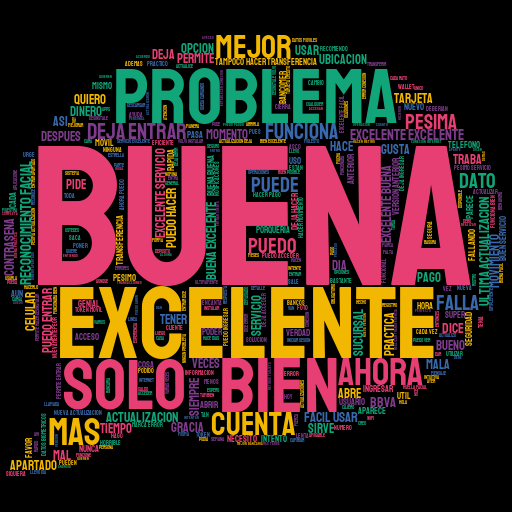

In [34]:
get_wordcloud(text = " ".join(df["t_content_clean"].sample(frac = 0.05)))

In [35]:
#Quitar hapaxes
corpus=" ".join(df["t_content_clean"].values)
fdist=nltk.FreqDist(corpus.split())
list_hapaxes=fdist.hapaxes()
df["t_content_clean"]=df["t_content_clean"].map(lambda text:" ".join([x for x in text.split(" ") if x not in list_hapaxes]))

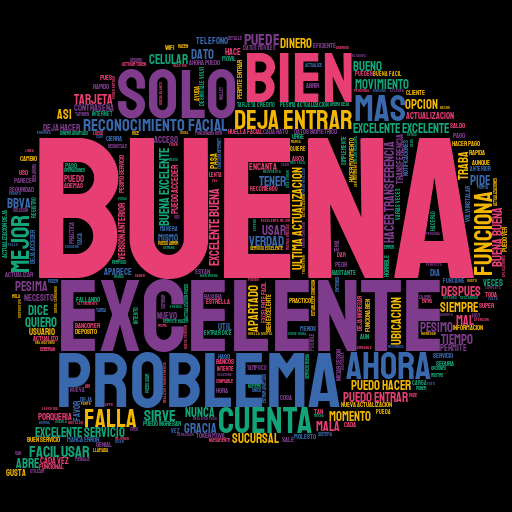

In [36]:
get_wordcloud(text = " ".join(df["t_content_clean"].sample(frac = 0.1)))

In [37]:
# Quitar hapaxes del validate
corpus=" ".join(validate["t_content_clean"].values)
fdist=nltk.FreqDist(corpus.split())
list_hapaxes=fdist.hapaxes()
validate["t_content_clean"]=validate["t_content_clean"].map(lambda text:" ".join([x for x in text.split(" ") if x not in list_hapaxes]))

## Polarity

In [38]:
df.reset_index(drop=True,inplace=True)

In [39]:
validate.reset_index(drop=True, inplace=True)

In [40]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/daniela/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [41]:
#pip install sentiment-analysis-spanish

In [42]:
from sentiment_analysis_spanish import sentiment_analysis

In [43]:
sid = sentiment_analysis.SentimentAnalysisSpanish()

In [44]:
df['v_sentiment'] = df['t_content_clean'].apply(lambda x: sid.sentiment(x))

In [46]:
validate['v_sentiment'] = validate['t_content_clean'].apply(lambda x: sid.sentiment(x))

In [47]:
df

,id_id,d_at,t_content,v_reviewCreatedVersion,t_reviewId,c_thumbsUpCount,tgt,idioma,t_content_clean,list_of_words,longitud,v_sentiment
0,181791,2020-10-27 22:05:24,esta fallando y no puedo ingresar ya elimine e...,11 24 200905,gp aoqptohgojgppexssrb14n 512ml1vabyj1qlqxqhlp...,0,1,__label__es,fallando puedo ingresar elimine cache puedo in...,"['fallando', 'puedo', 'ingresar', 'elimine', '...",7,0.468247
1,182630,2020-12-02 10:20:51,like,11 27 201107,gp aoqptohlam2kb6doypd30pl8wg3es5xrxy7zwsvm9a1...,0,1,__label__en,like,['like'],1,0.497892
2,35783,2020-03-28 07:53:04,buena,11 17 200207,gp aoqptogvcuwmstqn5kclkrwkyi1dskpfztuqw9wwv q...,0,1,__label__es,buena,['buena'],1,0.677402
3,196552,2020-10-06 15:42:03,excelente aplicacion,11 25 200922,gp aoqptoeaoz96bupqnq7h30dxgob8 cudb7 xkuwvmnf...,0,1,__label__es,excelente,['excelente'],1,0.963389
4,77165,2019-07-15 20:23:47,excelente,10 90,gp aoqptoeylmqhyyhdqweb5wg7ru2ublqkajvrkuegnw ...,0,1,__label__pt,excelente,['excelente'],1,0.963389
...,...,...,...,...,...,...,...,...,...,...,...,...
157856,12674,2019-12-10 19:10:28,no puedo entrar a los apartados tengo que cerr...,10 90,gp aoqptoenkacpjvs4id0w06cawgmucecjvw1wct6r0zt...,0,0,__label__es,puedo entrar apartados cerrar sesion veces dej...,"['puedo', 'entrar', 'apartados', 'cerrar', 'se...",8,0.112448
157857,118763,2020-12-30 15:44:39,no deja hacer el pago del prestamo de nomina,11 28 201209,gp aoqptoh6xferd8wqhshl9yactb6hof3j6qqwgkbmekn...,0,0,__label__es,deja hacer pago prestamo nomina,"['deja', 'hacer', 'pago', 'prestamo', 'nomina']",5,0.034726
157858,34057,2020-02-16 10:04:15,muy pocas veces ls utilizo,10 90,gp aoqptohu7fchzatf1gu4zjoy k1obv3ew7wxh4wfh6v...,0,1,__label__es,pocas veces utilizo,"['pocas', 'veces', 'utilizo']",3,0.237208
157859,151619,2021-05-15 11:52:24,excelente app super facil de usar muy practico...,11 33 210429,gp aoqptofhws1lczezljawayen36xzstnxcbo9jrl4xtx...,0,1,__label__es,excelente super facil usar practico recomiendo...,"['excelente', 'super', 'facil', 'usar', 'pract...",7,0.995506


In [48]:
my_histogram(df,"v_sentiment",100,title="v_sentiment",x_title="v_sentiment",y_title="conteo")

In [49]:
df["tgt"].value_counts(1)

1    0.632031
0    0.367969
Name: tgt, dtype: float64

In [50]:
df["v_sentiment"].value_counts(1)

9.633894e-01    0.120163
6.774024e-01    0.092613
4.978923e-01    0.072507
6.323721e-01    0.023502
9.981475e-01    0.013873
                  ...   
1.093872e-04    0.000006
5.173685e-08    0.000006
2.963340e-01    0.000006
5.854464e-05    0.000006
9.955060e-01    0.000006
Name: v_sentiment, Length: 71322, dtype: float64

In [51]:
df["longitud"].describe()

count    157861.000000
mean          7.143341
std           8.146006
min           1.000000
25%           1.000000
50%           4.000000
75%          10.000000
max         151.000000
Name: longitud, dtype: float64

In [52]:
validate["longitud"].describe()

count    39476.000000
mean         7.158755
std          8.261787
min          1.000000
25%          1.000000
50%          4.000000
75%         10.000000
max        177.000000
Name: longitud, dtype: float64

In [53]:
my_histogram(df,"longitud",5,title="longitud",x_title="longitud",y_title="conteo")

In [54]:
df[df["longitud"]<=50].describe()

,id_id,c_thumbsUpCount,tgt,longitud,v_sentiment
count,157820.000000,157820.000000,157820.000000,157820.000000,1.578200e+05
mean,99918.585401,0.555899,0.632163,7.128564,4.533526e-01
std,57733.066178,8.536957,0.482218,8.088699,3.668138e-01
min,0.000000,0.000000,0.000000,1.000000,1.757986e-24
25%,49844.750000,0.000000,0.000000,1.000000,3.345894e-02
50%,99987.500000,0.000000,1.000000,4.000000,4.978923e-01
75%,149817.250000,0.000000,1.000000,10.000000,7.700446e-01
max,199999.000000,1069.000000,1.000000,50.000000,1.000000e+00


In [55]:
df = df[df['longitud']<=50]

In [56]:
df.shape

(157820, 12)

In [57]:
df

,id_id,d_at,t_content,v_reviewCreatedVersion,t_reviewId,c_thumbsUpCount,tgt,idioma,t_content_clean,list_of_words,longitud,v_sentiment
0,181791,2020-10-27 22:05:24,esta fallando y no puedo ingresar ya elimine e...,11 24 200905,gp aoqptohgojgppexssrb14n 512ml1vabyj1qlqxqhlp...,0,1,__label__es,fallando puedo ingresar elimine cache puedo in...,"['fallando', 'puedo', 'ingresar', 'elimine', '...",7,0.468247
1,182630,2020-12-02 10:20:51,like,11 27 201107,gp aoqptohlam2kb6doypd30pl8wg3es5xrxy7zwsvm9a1...,0,1,__label__en,like,['like'],1,0.497892
2,35783,2020-03-28 07:53:04,buena,11 17 200207,gp aoqptogvcuwmstqn5kclkrwkyi1dskpfztuqw9wwv q...,0,1,__label__es,buena,['buena'],1,0.677402
3,196552,2020-10-06 15:42:03,excelente aplicacion,11 25 200922,gp aoqptoeaoz96bupqnq7h30dxgob8 cudb7 xkuwvmnf...,0,1,__label__es,excelente,['excelente'],1,0.963389
4,77165,2019-07-15 20:23:47,excelente,10 90,gp aoqptoeylmqhyyhdqweb5wg7ru2ublqkajvrkuegnw ...,0,1,__label__pt,excelente,['excelente'],1,0.963389
...,...,...,...,...,...,...,...,...,...,...,...,...
157856,12674,2019-12-10 19:10:28,no puedo entrar a los apartados tengo que cerr...,10 90,gp aoqptoenkacpjvs4id0w06cawgmucecjvw1wct6r0zt...,0,0,__label__es,puedo entrar apartados cerrar sesion veces dej...,"['puedo', 'entrar', 'apartados', 'cerrar', 'se...",8,0.112448
157857,118763,2020-12-30 15:44:39,no deja hacer el pago del prestamo de nomina,11 28 201209,gp aoqptoh6xferd8wqhshl9yactb6hof3j6qqwgkbmekn...,0,0,__label__es,deja hacer pago prestamo nomina,"['deja', 'hacer', 'pago', 'prestamo', 'nomina']",5,0.034726
157858,34057,2020-02-16 10:04:15,muy pocas veces ls utilizo,10 90,gp aoqptohu7fchzatf1gu4zjoy k1obv3ew7wxh4wfh6v...,0,1,__label__es,pocas veces utilizo,"['pocas', 'veces', 'utilizo']",3,0.237208
157859,151619,2021-05-15 11:52:24,excelente app super facil de usar muy practico...,11 33 210429,gp aoqptofhws1lczezljawayen36xzstnxcbo9jrl4xtx...,0,1,__label__es,excelente super facil usar practico recomiendo...,"['excelente', 'super', 'facil', 'usar', 'pract...",7,0.995506


In [58]:
#validate=validate[validate["longitud"]<=50], no creo que sea necesario eliminar a la prueba

## Input texto

In [59]:
X_content = df["t_content_clean"]

In [60]:
X_content.str.split().str.len().max()

50

In [61]:
def vectorize_text(text, max_words, max_sequence_length):
    tokenizer = Tokenizer(num_words=max_words, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
    tokenizer.fit_on_texts(text)
    word_index = tokenizer.word_index
    print('Found %s unique tokens.' % len(word_index))
    X = tokenizer.texts_to_sequences(text)
    X = pad_sequences(X, maxlen=max_sequence_length)
    return X, tokenizer

In [62]:
content_max_words = 10000
content_max_sequence_length = 48

In [63]:
X_content, tokenizer_content = vectorize_text(X_content, content_max_words, content_max_sequence_length)

Found 13717 unique tokens.


#### Se hace lo mismo con validate

In [64]:
Xv_content=validate["t_content_clean"]

In [65]:
Xv_content.str.split().str.len().max()

134

In [66]:
content_max_words = 10000
content_max_sequence_length = 64

In [67]:
Xv_content, tokenizer_vcontent = vectorize_text(Xv_content, content_max_words, content_max_sequence_length)

Found 6731 unique tokens.


## Input numérico

In [68]:
df.head()

,id_id,d_at,t_content,v_reviewCreatedVersion,t_reviewId,c_thumbsUpCount,tgt,idioma,t_content_clean,list_of_words,longitud,v_sentiment
0,181791,2020-10-27 22:05:24,esta fallando y no puedo ingresar ya elimine e...,11 24 200905,gp aoqptohgojgppexssrb14n 512ml1vabyj1qlqxqhlp...,0,1,__label__es,fallando puedo ingresar elimine cache puedo in...,"['fallando', 'puedo', 'ingresar', 'elimine', '...",7,0.468247
1,182630,2020-12-02 10:20:51,like,11 27 201107,gp aoqptohlam2kb6doypd30pl8wg3es5xrxy7zwsvm9a1...,0,1,__label__en,like,['like'],1,0.497892
2,35783,2020-03-28 07:53:04,buena,11 17 200207,gp aoqptogvcuwmstqn5kclkrwkyi1dskpfztuqw9wwv q...,0,1,__label__es,buena,['buena'],1,0.677402
3,196552,2020-10-06 15:42:03,excelente aplicacion,11 25 200922,gp aoqptoeaoz96bupqnq7h30dxgob8 cudb7 xkuwvmnf...,0,1,__label__es,excelente,['excelente'],1,0.963389
4,77165,2019-07-15 20:23:47,excelente,10 90,gp aoqptoeylmqhyyhdqweb5wg7ru2ublqkajvrkuegnw ...,0,1,__label__pt,excelente,['excelente'],1,0.963389


In [69]:
num_fts =["c_thumbsUpCount","longitud","v_sentiment"]

In [70]:
X_fts = df[num_fts]

In [71]:
pipe = Pipeline([("imputer", SimpleImputer(strategy="median")), ("scaler", MinMaxScaler())])

In [72]:
X_fts = pipe.fit_transform(X_fts)

In [73]:
X_fts

array([[0.        , 0.12244898, 0.46824671],
       [0.        , 0.        , 0.49789227],
       [0.        , 0.        , 0.67740243],
       ...,
       [0.        , 0.04081633, 0.23720767],
       [0.        , 0.12244898, 0.99550598],
       [0.        , 0.06122449, 0.71687038]])

In [74]:
X_content

array([[   0,    0,    0, ...,  394,    3,   20],
       [   0,    0,    0, ...,    0,    0, 1638],
       [   0,    0,    0, ...,    0,    0,    2],
       ...,
       [   0,    0,    0, ..., 1013,   35,  786],
       [   0,    0,    0, ...,  195,  193,  665],
       [   0,    0,    0, ...,   94,   11,   18]], dtype=int32)

In [75]:
Xv_fts = validate[num_fts]

In [76]:
Xv_fts=pipe.fit_transform(Xv_fts)

In [77]:
Xv_content

array([[   0,    0,    0, ...,    0,   38,  154],
       [   0,    0,    0, ...,  316,  167,  454],
       [   0,    0,    0, ...,  627,  131, 1699],
       ...,
       [   0,    0,    0, ...,  133,  394,   45],
       [   0,    0,    0, ...,  186,  668,  256],
       [   0,    0,    0, ...,  344,  231,   87]], dtype=int32)

## Target

In [78]:
y = df[['tgt']]

In [79]:
sc = MinMaxScaler()

In [80]:
y = sc.fit_transform(y).ravel()

In [81]:
y

array([1., 1., 1., ..., 1., 1., 1.])

In [82]:
yval=validate[["tgt"]]

In [83]:
yval=sc.fit_transform(yval).ravel()

### Train-test split

In [84]:
Xcontent_train, Xcontent_test, Xfeatures_train, Xfeatures_test, y_train, y_test = train_test_split(X_content, X_fts, y, test_size=0.3, shuffle=True)

### Arquitectura del modelo (functional API)

#### Capas de entrada

In [85]:
content_input = Input(shape=(None,), name="t_content_clean")
features_input = Input(shape=(X_fts.shape[1],), name="features")

#### Capas de embededing

In [86]:
content_embedding = Embedding(content_max_words, 300)(content_input)

2022-05-26 00:25:20.185884: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


#### Capas GRU

In [87]:
content_features = GRU(200)(content_embedding)

#### Capa densa para variables numéricas

In [88]:
features_network = Dense(100, activation="relu")(features_input)

#### Capa de concatenación

In [89]:
x = concatenate([content_features, features_network])

#### Capa densa

In [90]:
x = Dense(300, activation="softmax")(x)

#### Capa de salida

In [91]:
pred = Dense(1, activation="sigmoid")(x)

#### Creación del modelo

In [92]:
model = Model(inputs=[content_input, features_input], outputs=pred)

In [93]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 t_content_clean (InputLayer)   [(None, None)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, None, 300)    3000000     ['t_content_clean[0][0]']        
                                                                                                  
 features (InputLayer)          [(None, 3)]          0           []                               
                                                                                                  
 gru (GRU)                      (None, 200)          301200      ['embedding[0][0]']              
                                                                                              

### Configuración de modelo

In [94]:
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

#### Callbacks

In [95]:
early_stopping = EarlyStopping(monitor='val_accuracy', patience=15, min_delta=0.0001)

In [96]:
checkpoint = ModelCheckpoint('modelIV_{val_accuracy:.3f}.h5',
                             save_best_only=True,
                             save_weights_only=False,
                             monitor='val_accuracy')

In [97]:
tensorboard = TensorBoard(log_dir="./logs")

#### Entrenamiento

In [98]:
history = model.fit(x={"t_content_clean": Xcontent_train, "features": Xfeatures_train}, 
                    y=y_train, 
                    epochs=100,
                    batch_size=50,
                    validation_data=([Xcontent_test, Xfeatures_test], y_test),
                    callbacks=[early_stopping, checkpoint, tensorboard])

Epoch 1/100
2210/2210 [==============================] - 290s 128ms/step - loss: 0.3960 - accuracy: 0.8844 - val_loss: 0.2845 - val_accuracy: 0.9065
Epoch 2/100
2210/2210 [==============================] - 281s 127ms/step - loss: 0.2546 - accuracy: 0.9108 - val_loss: 0.2450 - val_accuracy: 0.9066
Epoch 3/100
2210/2210 [==============================] - 284s 128ms/step - loss: 0.2170 - accuracy: 0.9202 - val_loss: 0.2373 - val_accuracy: 0.9074
Epoch 4/100
2210/2210 [==============================] - 284s 128ms/step - loss: 0.1924 - accuracy: 0.9283 - val_loss: 0.2453 - val_accuracy: 0.9019
Epoch 5/100
2210/2210 [==============================] - 282s 127ms/step - loss: 0.1717 - accuracy: 0.9369 - val_loss: 0.2555 - val_accuracy: 0.9026
Epoch 6/100
2210/2210 [==============================] - 284s 128ms/step - loss: 0.1549 - accuracy: 0.9431 - val_loss: 0.2759 - val_accuracy: 0.8966
Epoch 7/100
2210/2210 [==============================] - 295s 133ms/step - loss: 0.1391 - accuracy: 0.9500

#### Análisis de resultados

In [99]:
results = pd.DataFrame(data = zip(history.history["loss"], history.history["val_loss"], history.history["accuracy"], history.history["val_accuracy"]), columns=["loss", "val_loss", "accuracy", "val_accuracy"])

In [100]:
results.iplot(theme="solar")

In [101]:
model.predict([Xcontent_test, Xfeatures_test])

array([[0.9973724 ],
       [0.99437416],
       [0.9973111 ],
       ...,
       [0.99437416],
       [0.00465488],
       [0.97978663]], dtype=float32)

In [102]:
loss, *metrics = model.evaluate([Xcontent_test, Xfeatures_test], y_test)

1480/1480 [==============================] - 27s 18ms/step - loss: 0.4521 - accuracy: 0.8867


In [103]:
y_pred = sc.inverse_transform(model.predict([Xcontent_test, Xfeatures_test]))

In [104]:
y_pred=y_pred.round(0)

In [105]:
y_true = sc.inverse_transform(np.expand_dims(y_test, axis=1))

In [106]:
pd.DataFrame(zip( y_true.ravel(), y_pred.ravel())).iplot(kind="histogram", histnorm="probability density", theme="solar")

### Con el conjunto validate

In [107]:
loss, *metrics = model.evaluate([Xv_content, Xv_fts], yval)

1234/1234 [==============================] - 31s 25ms/step - loss: 0.9848 - accuracy: 0.7546


In [108]:
y_pred_val = sc.inverse_transform(model.predict([Xv_content, Xv_fts]))

In [109]:
y_pred_val=y_pred_val.round(0)

In [110]:
y_pred_val

array([[1.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [1.]], dtype=float32)

In [111]:
y_true_val = sc.inverse_transform(np.expand_dims(yval, axis=1))

In [112]:
pd.DataFrame(zip( y_true_val.ravel(), y_pred_val.ravel())).iplot(kind="histogram", histnorm="probability density",bins=(0,2), theme="solar")

Invalid format for bins generation
Invalid format for bins generation


In [113]:
plot_model(model, "multi_input_model.png", show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [114]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [115]:
pip install pydotplus

Note: you may need to restart the kernel to use updated packages.


In [116]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.
